# [California housing dataset](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_california_housing.html) - predict the price of a house


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

A description of the dataset can be found in the [User guide](https://scikit-learn.org/stable/datasets/real_world.html#california-housing-dataset).


In [3]:
housing = fetch_california_housing()
print(housing.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

:Number of Instances: 20640

:Number of Attributes: 8 numeric, predictive attributes and the target

:Attribute Information:
    - MedInc        median income in block group
    - HouseAge      median house age in block group
    - AveRooms      average number of rooms per household
    - AveBedrms     average number of bedrooms per household
    - Population    block group population
    - AveOccup      average number of household members
    - Latitude      block group latitude
    - Longitude     block group longitude

:Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived from the 1990 U.S. census, using one row per ce

In [4]:
print(housing.data.shape, housing.target.shape)

(20640, 8) (20640,)


In [5]:
print(housing.feature_names)

['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude']


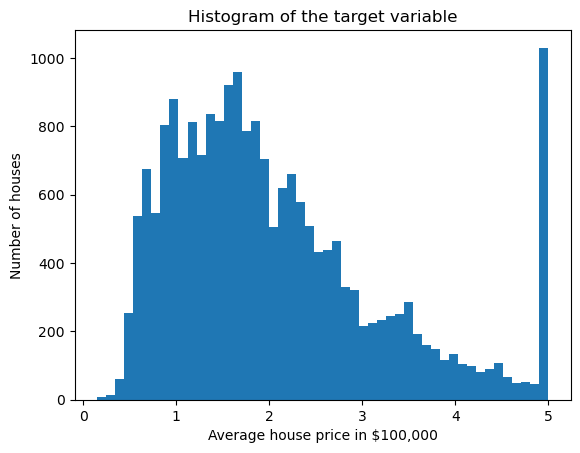

In [6]:
# Plot the histogram of the target variable
plt.hist(housing.target, bins=50)
plt.xlabel("Average house price in $100,000")
plt.ylabel("Number of houses")
plt.title("Histogram of the target variable")
plt.show();

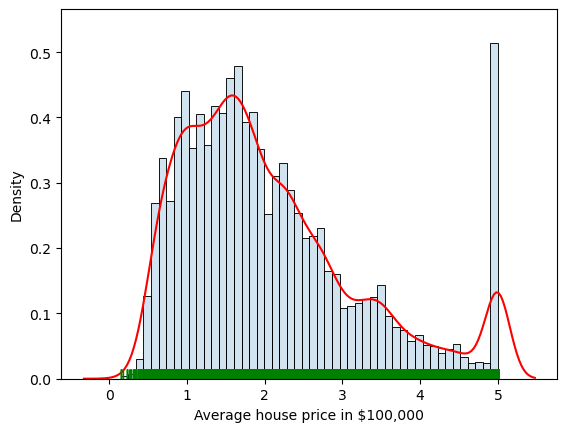

In [7]:
# Plot the histogram of the target variable with seaborn (histplot, kdeplot, rugplot)
fig, ax = plt.subplots()

sns.histplot(housing.target, bins=50, stat="density", ax=ax, alpha=0.2)
sns.kdeplot(housing.target, color="r")
sns.rugplot(housing.target, color="g")
ax.set_xlabel("Average house price in $100,000")
ax.set_ylabel("Density")
plt.show();

The distribution of the target variable is shown above. It shows that the target variable is right-skewed. This is a common characteristic of house prices. It is cut off at 5, which is the maximum value of the target variable in this dataset.

How can we deal with the cut-off at 5? One way is to transform the target variable. A common transformation is the logarithm. This is because the logarithm of a right-skewed variable is more symmetric. The distribution of the logarithm of the target variable is shown below. It is more symmetric than the distribution of the target variable.


This becomes also clear when we look at the boxplots of the target variable. Again, we see outliers.


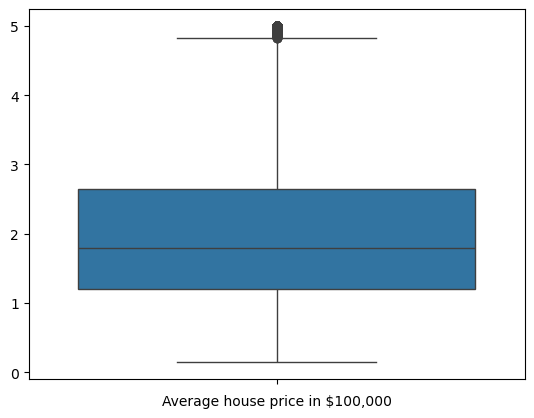

In [8]:
# Box plot for the target variable
fig, ax = plt.subplots()
sns.boxplot(housing.target, ax=ax)
ax.set_xlabel("Average house price in $100,000")
plt.show();

When we look at the boxplots of the other features we see that there are also outliers for the features `MedInc`, `AveRooms`, `AveBedrms`, `Population` and `AveOccup`, but they are hard to see.


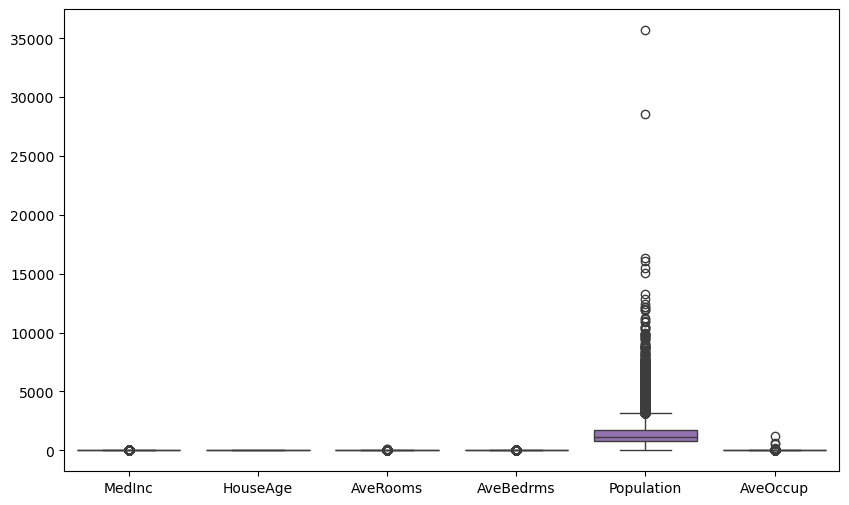

In [9]:
# Box plot for the features `MedInc`, `HouseAge`, `AveRooms`,`AveBedrooms`, `Population`, and `AveOccup`
features = ["MedInc", "HouseAge", "AveRooms", "AveBedrms", "Population", "AveOccup"]

# select the columns corresponding to the features
data = pd.DataFrame(housing.data, columns=housing.feature_names)
data = data[features]

# Plot the box plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(data=data, ax=ax)
plt.show();

So we perform log transformation on the target variable and the features `MedInc`, `AveRooms`, `AveBedrms`, `Population` and `AveOccup`.


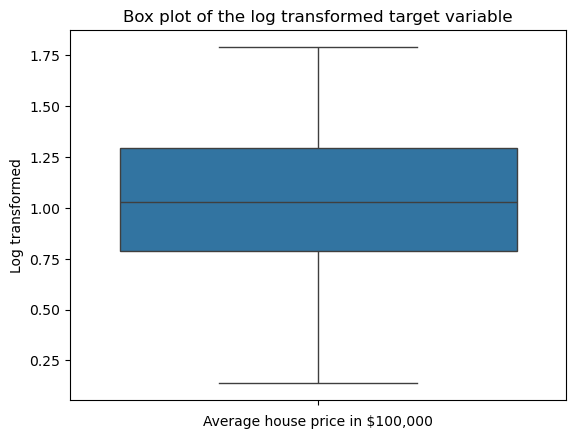

In [10]:
# Box plot for the target variable after applying the log transformation
housing_log1p = np.log1p(housing.target)

fig, ax = plt.subplots()
sns.boxplot(housing_log1p, ax=ax)
ax.set_xlabel("Average house price in $100,000")
ax.set_ylabel("Log transformed")
ax.set_title("Box plot of the log transformed target variable")
plt.show();

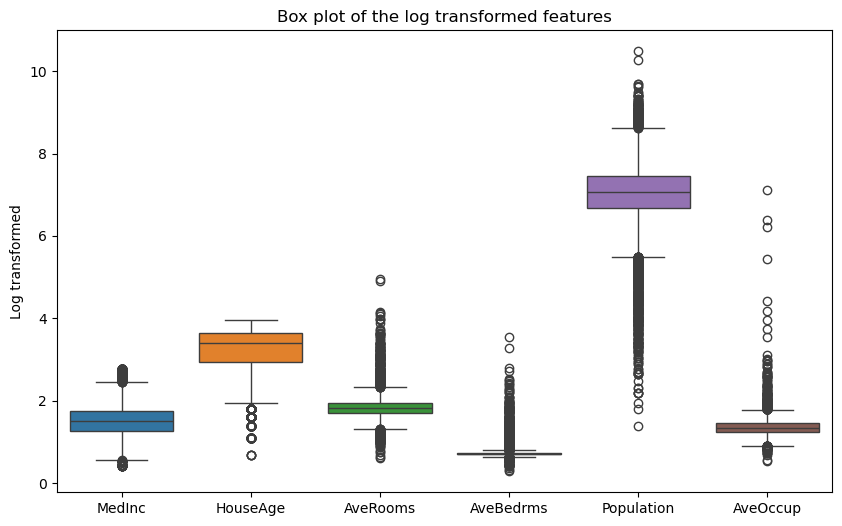

In [11]:
# Box plot for the features `MedInc`, `HouseAge`, `AveRooms`,`AveBedrooms`,`Population` and `AveOccup`
features = ["MedInc", "HouseAge", "AveRooms", "AveBedrms", "Population", "AveOccup"]

# select the columns corresponding to the features
data = pd.DataFrame(housing.data, columns=housing.feature_names)
data = data[features]

# log1p transformation
data = np.log1p(data)

# Plot the box plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(data=data, ax=ax)
ax.set_ylabel("Log transformed")
ax.set_title("Box plot of the log transformed features")
plt.show();

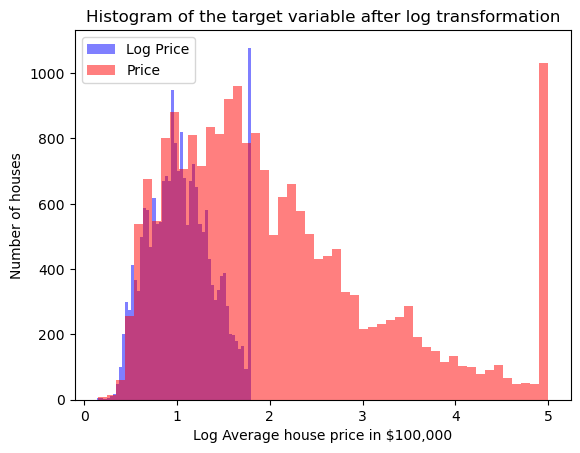

In [12]:
# apply log transformation to the target variable
y_log = np.log1p(housing.target)

# Plot the histogram of the target variable after log transformation
plt.hist(y_log, bins=50, color="blue", alpha=0.5)
plt.hist(housing.target, bins=50, color="red", alpha=0.5)
plt.xlabel("Log Average house price in $100,000")
plt.ylabel("Number of houses")
plt.title("Histogram of the target variable after log transformation")
plt.legend(["Log Price", "Price"])
plt.show();

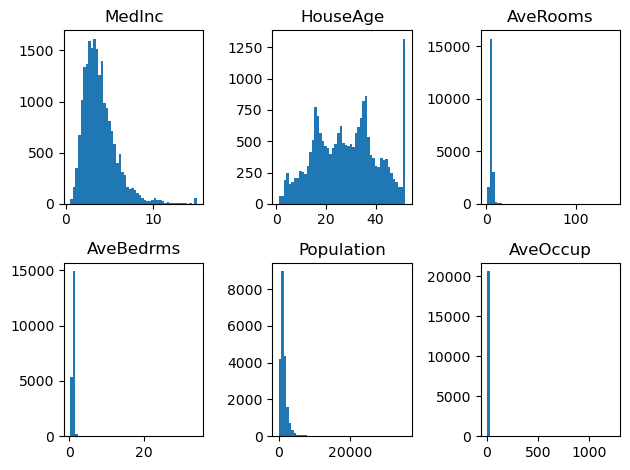

In [13]:
# show the histogram of the features 'MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup'
for i in range(6):
    plt.subplot(2, 3, i + 1)
    plt.hist(housing.data[:, i], bins=50)
    plt.title(housing.feature_names[i])
plt.tight_layout()
plt.show();


`HouseAge` seems to have a bimodal distribution and is capped at 52. `MedInc` seems to have a right-skewed distribution. The other features are not distinguishable from graphs.

So let's perform log transformation on the features `MedInc`, `AveRooms`, `AveBedrms`, `Population` and `AveOccup`.

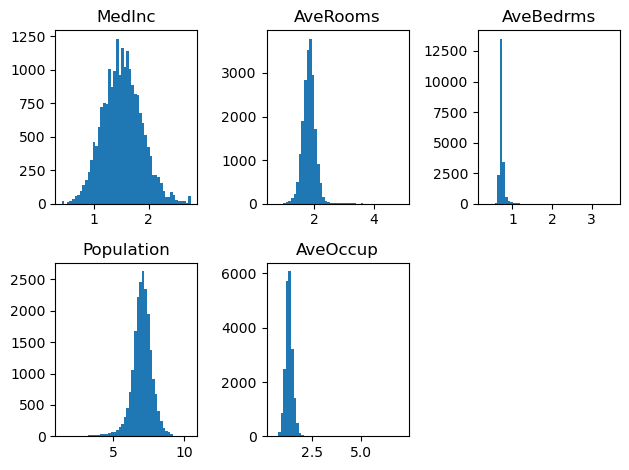

In [14]:
# show the log1p histogram of the features 'MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup'
features = ["MedInc", "AveRooms", "AveBedrms", "Population", "AveOccup"]

# select the columns corresponding to the features
data = pd.DataFrame(housing.data, columns=housing.feature_names)
data = data[features]

# log1p transformation
data = np.log1p(data)

for i in range(5):
    plt.subplot(2, 3, i + 1)
    plt.hist(data.iloc[:, i], bins=50)
    plt.title(features[i])
plt.tight_layout()
plt.show();

Now we can see that the distributions of the features `MedInc`, `AveRooms`, `AveBedrms`, `Population` and `AveOccup` are more symmetric.

Combinations of features gives us a better understanding of the data. For example, the scatter plot of `MedInc` and the target variable shows a positive correlation.

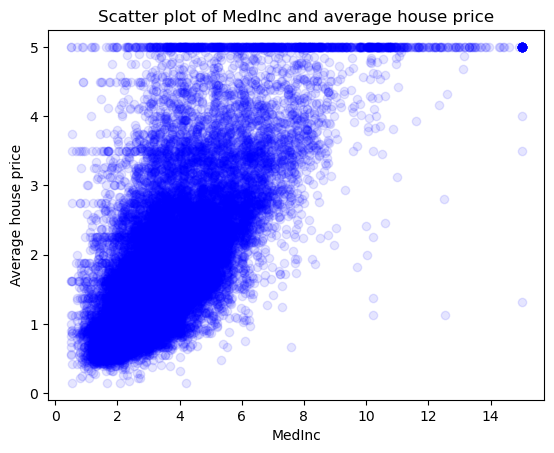

In [15]:
# plot the scatter plot of the feature 'MedInc' and the target variable
plt.scatter(housing.data[:, 0], housing.target, color="blue", alpha=0.1)
plt.xlabel("MedInc")
plt.ylabel("Average house price")
plt.title("Scatter plot of MedInc and average house price")
plt.show();

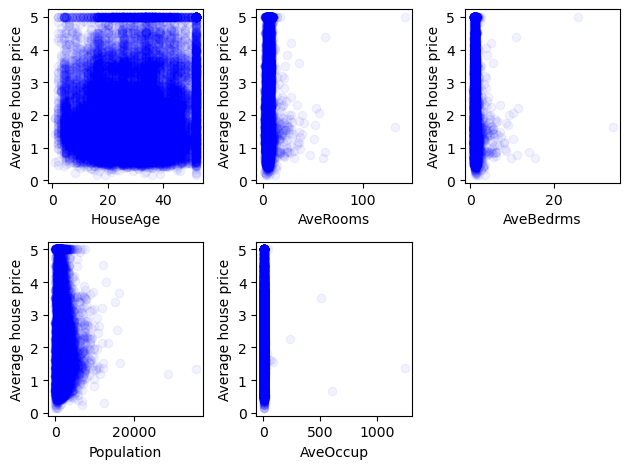

In [22]:
# plot scatter plots of the features 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup' and the target variable
for i in range(1, 6):
    plt.subplot(2, 3, i)
    plt.scatter(housing.data[:, i], housing.target, color="blue", alpha=0.05)
    plt.xlabel(housing.feature_names[i])
    plt.ylabel("Average house price")
plt.tight_layout()
plt.show();

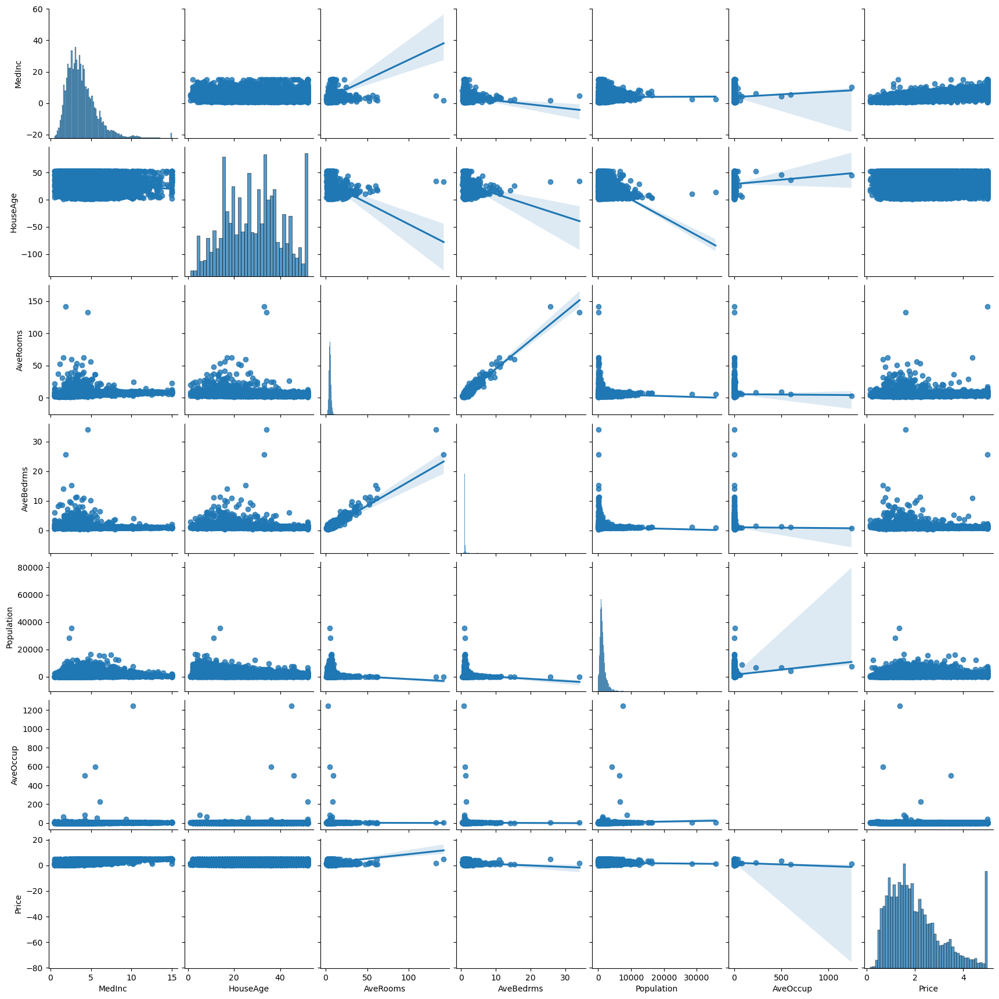

In [21]:
df_housing = pd.DataFrame(housing.data, columns=housing.feature_names)
df_housing["Price"] = housing.target

features = ["MedInc", "HouseAge", "AveRooms", "AveBedrms", "Population", "AveOccup", "Price"]

sns.pairplot(data=df_housing[features], kind="reg") # try scatter, kde or hist
plt.show();

For the other variables we see that there is no clear relationship with the target variable, except for `AveRooms` and `AveBedrms` which have a positive correlation.

Another correlation seems to be between `Population` as well as `AveRooms` and `AveBedrms`, less population means more rooms and bedrooms.

We have two outliers in the scatter plot for `AveRooms` > 70, `AveBedrms` > 16, `Population` > 16000 . These are the two points with a high number of rooms, bedrooms and population. We will later remove these outliers. I also spotted outliers for `AveOccup` > 100. We will remove these outliers as well.

It becomes clear that the features `MedInc`, `HouseAge` and `Price` are capped. `MedInc` is capped at 15, `HouseAge` is capped at 52 and `Price` is capped at 5.

## Maps

Next we look at the geographical distribution of the data. The scatter plot of the latitude and longitude shows that the data is from California. The scatter plot of the latitude and longitude colored by the target variable shows that the house prices are higher near the coast. Especially in the San Francisco Bay Area and around Los Angeles.

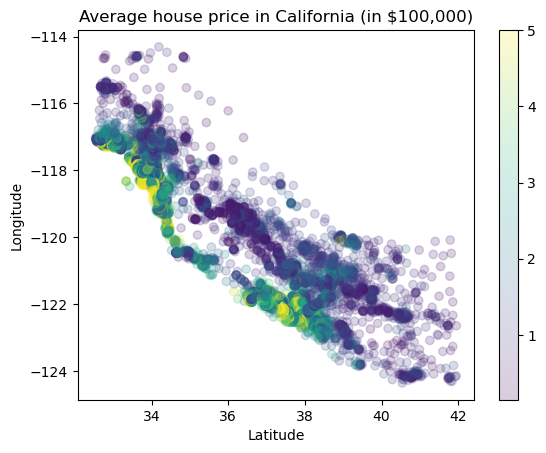

In [16]:
# plot lat and long, color by average house price
plt.scatter(housing.data[:, 6], housing.data[:, 7], c=housing.target, alpha=0.2)
plt.colorbar()
plt.xlabel("Latitude")
plt.ylabel("Longitude")
plt.title("Average house price in California (in $100,000)")
plt.show();

In [218]:
import plotly.express as px
import pandas as pd

# Assuming you have a 'housing' dataset with 'Latitude', 'Longitude', and 'Price'
df = pd.DataFrame(housing.data, columns=housing.feature_names)
df["Price"] = housing.target



for feature in ["MedInc", "HouseAge", "AveRooms", "AveBedrms", "Population", "AveOccup", "Price"]:
# Create the scatter_geo plot
    fig = px.scatter_geo(
        df,
        lat="Latitude",
        lon="Longitude",
        color=feature,
        color_continuous_scale="Bluered",
        opacity=0.2,
#        title="Average House Price in California",
    )

    # Update map appearance
    fig.update_geos(
        center=dict(lat=37, lon=-119),
        projection_scale=25,
        projection_type="mercator",
        resolution=50,
    )

    # Updating layout for larger map and smaller color bar
    fig.update_layout(
        margin=dict(l=20, r=10, t=40, b=10),
        height=500,
        width=550,
    )

    # Override the color bar layout
    fig.update_coloraxes(
        colorbar=dict(
            title=feature,
            titleside="right",
            orientation="v",
        )
    )

    # Show the figure
    fig.show()

In [24]:
import plotly.express as px
import pandas as pd

# Assuming you have a 'housing' dataset with 'Latitude', 'Longitude', and 'Price'
df = pd.DataFrame(housing.data, columns=housing.feature_names)
df["Price"] = housing.target

# Create the scatter_map plot
fig = px.scatter_mapbox(
    df,
    lat="Latitude",
    lon="Longitude",
    color="Price",
    color_continuous_scale="Bluered",
    opacity=0.2,
    title="Average House Price in San Francisco",
    height=500,
    width=550,
)
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center_lon=-122.4,
    mapbox_center_lat=37.7,
    mapbox_zoom=9,
    margin={"r": 0, "t": 40, "l": 0, "b": 0},
)
fig.update_coloraxes(
    colorbar=dict(
        title="Price in 100,000 $",
        titleside="right",
        orientation="v",
    )
)
fig.show()

In [26]:
# Load the data
X, y = fetch_california_housing(return_X_y=True)
X, y

(array([[   8.3252    ,   41.        ,    6.98412698, ...,    2.55555556,
           37.88      , -122.23      ],
        [   8.3014    ,   21.        ,    6.23813708, ...,    2.10984183,
           37.86      , -122.22      ],
        [   7.2574    ,   52.        ,    8.28813559, ...,    2.80225989,
           37.85      , -122.24      ],
        ...,
        [   1.7       ,   17.        ,    5.20554273, ...,    2.3256351 ,
           39.43      , -121.22      ],
        [   1.8672    ,   18.        ,    5.32951289, ...,    2.12320917,
           39.43      , -121.32      ],
        [   2.3886    ,   16.        ,    5.25471698, ...,    2.61698113,
           39.37      , -121.24      ]]),
 array([4.526, 3.585, 3.521, ..., 0.923, 0.847, 0.894]))

In [27]:
X.shape, y.shape

((20640, 8), (20640,))

In [28]:
# Check for missing values
np.isnan(X).sum(), np.isnan(y).sum()

(0, 0)

In [29]:
# Split the data train, val, test (60/20/20)
X_full_train, X_test, y_full_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
X_train, X_val, y_train, y_val = train_test_split(
    X_full_train, y_full_train, test_size=0.25, random_state=42
)

In [91]:
# # Scale the data
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_val_scaled = scaler.transform(X_val)
# X_test_scaled = scaler.transform(X_test)

In [30]:
# Train the model
model = LinearRegression(n_jobs=-1)
model.fit(X_train, y_train)

LinearRegression(n_jobs=-1)

In [31]:
# Evaluate the model
model.score(X_val, y_val)

0.6142000785497226

In [32]:
# # Train the scaled model
# model_scaled = LinearRegression(n_jobs=-1)
# model_scaled.fit(X_train_scaled, y_train)

In [33]:
# # Evaluate the model
# model_scaled.score(X_val_scaled, y_val)

In [34]:
model.coef_

array([ 4.55603516e-01,  9.51867573e-03, -1.34972463e-01,  8.62278742e-01,
       -8.39178933e-06, -3.69767511e-03, -4.16827258e-01, -4.29879849e-01])

In [35]:
model.intercept_

-36.7041211614242

In [41]:
# Make predictions
y_pred = model.predict(X_val)

# create a dataframe with the actual and predicted values
df = pd.DataFrame({"Actual": y_val, "Predicted": y_pred})
df

,Actual,Predicted
0,0.96700,1.449107
1,0.75500,1.033908
2,4.30900,2.351465
3,3.32600,2.254493
4,5.00001,3.405861
...,...,...
4123,0.81100,1.199964
4124,3.45000,2.449945
4125,3.44200,3.391948
4126,3.87800,2.598973


<Axes: >

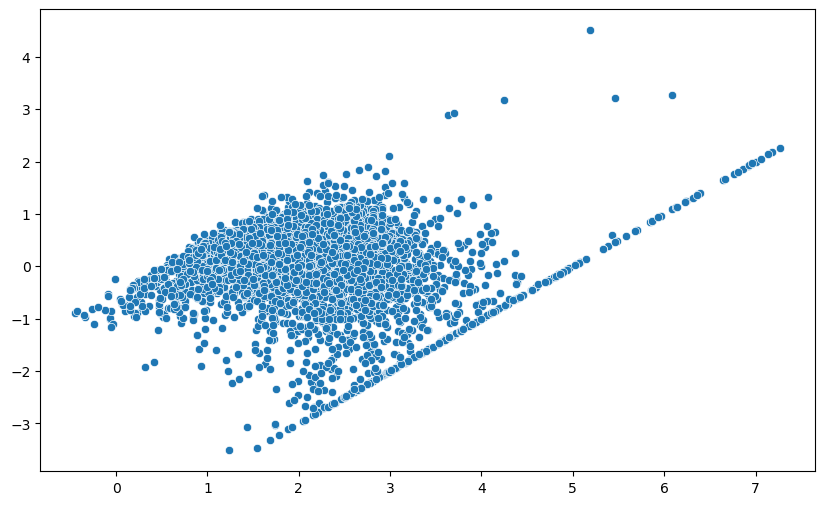

In [43]:
# Plot model residuals
fig, ax = plt.subplots(figsize=(10, 6))
plt.set_title("Model residuals")
plt.scatter()

In [ ]:
# Plot the predictions
plt.plot(y_val, y_pred, "bo")

x = np.linspace(0, 5, 100)
y = x
plt.plot(x, y, "r")

plt.xlim(0, 7)
plt.ylim(0, 7)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs Predicted")
plt.show();